![](http://take.ms/XaUPm)
![](http://take.ms/1GV9l)
![](http://take.ms/Bl6FR)
![](http://take.ms/1fIFP)
![](http://take.ms/hbueY)
![](http://take.ms/C213V)

In [1]:
sigma1 = 1
sigma2 = seq(from = 0.5, to = 2, by = 0.01)
p1=p2 = seq(from = 0, to = 1, by = 0.01)
n1=n2 = 50





In [2]:
generate.X1 <- function(n1, sigma1, p1, weights) {
    F1 <- runif(n1, min = -3, max = 3)

    X1.Norm.ind.matr <- matrix(unlist(lapply(p1, function(p) weights <= p)), nrow = length(weights))
    X1.F1.ind.mart <- !X1.Norm.ind.matr

    X1.F1 <- F1*X1.F1.ind.mart
    
    X1.Norm <- rnorm(n1, mean = 0, sd = sigma1)
    X1 <- X1.Norm*X1.Norm.ind.matr + X1.F1
        
    return(X1)
}

In [3]:
generate.X2n <- function(n2, sigma2, p2, weights) {
    F2 <- runif(n2, min = -3, max = 3)

    X2.Norm.ind.matr <- matrix(unlist(lapply(p2, function(p) weights <= p)), nrow = length(weights))
    X2.F2.ind.mart <- !X2.Norm.ind.matr

    X2.F2 <- F2*X2.F2.ind.mart
        
    # Генерируем матрицу, в строках которой будут выбороки из
    # нормального распределения с sigma2[ind], где ind номер строки матрицы
    X2.norm.matr <- matrix(rnorm(n2*length(sigma2), mean = 0, sd = sigma2), nrow=length(sigma2))

    # Разделяем матрицу выборок на список выборок
    X2.norm.list <- split(X2.norm.matr, 1:length(sigma2))

    # Для каждой конкретной выборки X2.norm создаем  X2
    # В строках - матрица выборкок по p
    X2n <- lapply(X2.norm.list, function(X2.norm) X2.Norm.ind.matr*X2.norm + X2.F2)
        
    return(X2n)
}

In [4]:
weights = runif(n1)

In [5]:
X1 <- generate.X1(n1, sigma1, p1, weights)

In [6]:
X2n <- generate.X2n(n2, sigma2, p2, weights)

In [7]:
compute.p.value <- function(n, p, sigma1, sigma2, weights1, weights2) {
    X1 <- generate.X1(n, sigma1, p, weights1)
    X2n <- generate.X2n(n, sigma2, p, weights2)
    
    # список выборок из X1
    X1.list <- split(X1, 1:length(p))
    X2.1.list <- split(X2n[[61]], 1:length(p)) # выборки для 1-й дисперсии
    
    # Список по сигма, списокв по p
    X2n.list <- lapply(X2n, function(X2) split(X2,  1:length(p)))
        
    # Список по сигма, списков пар X1,X2 по p 
    X2n.X1 <- lapply(X2n.list, function(X2.list) split(t(rbind(X1.list, X2.list)), 1:length(p)))
        
    p.value.matr <- lapply(X2n.X1, function(X.sigm) 
        lapply(X.sigm, function(X) var.test(unlist(X[1]), unlist(X[2]))$p.value)
    )
            
    N       <- length(p)
    M       <- length(sigma2)
            
    PV_M <- matrix(unlist(p.value.matr), nrow=N, ncol=M)
    PW_M <- PV_M < 0.05
    return(list(PV_M, PW_M))
}

In [8]:
ans <- compute.p.value(n1, p1, sigma1, sigma2, weights, weights)

In [9]:
library(fields)

Warning message:
: package ‘fields’ was built under R version 3.2.3Loading required package: spam
Loading required package: grid
Spam version 1.3-0 (2015-10-24) is loaded.
Type 'help( Spam)' or 'demo( spam)' for a short introduction 
and overview of this package.
Help for individual functions is also obtained by adding the
suffix '.spam' to the function name, e.g. 'help( chol.spam)'.

Attaching package: ‘spam’

Следующие объекты скрыты от ‘package:base’:

    backsolve, forwardsolve

Loading required package: maps
Warning message:
: package ‘maps’ was built under R version 3.2.3
 # maps v3.1: updated 'world': all lakes moved to separate new #
 # 'lakes' database. Type '?world' or 'news(package="maps")'.  #




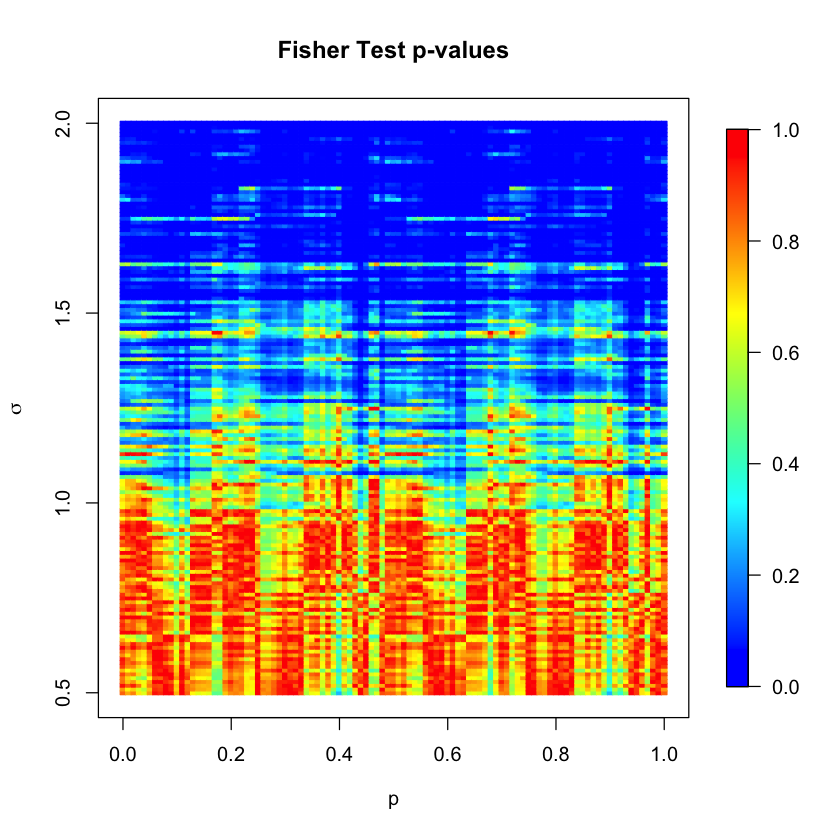

In [10]:
N       <- length(p1)
M       <- length(sigma2)

grid    <- expand.grid(x=p1, y=sigma2)


sigma.matr <- matrix(grid$x, nrow=N, ncol=M)
p.matr <- matrix(grid$y, nrow=N, ncol=M)

image.plot(sigma.matr, p.matr, ans[[1]], 
       col = colorRampPalette(c("blue", "cyan", "yellow", "red"))(1024), 
       main="Fisher Test p-values", xlab=expression(p), ylab=expression(sigma))

In [11]:
draw.p.value(ans[[1]], p1, sigma2)

ERROR: Error in eval(expr, envir, enclos): не могу найти функцию "draw.p.value"


In [280]:
sigma1 = 1
sigma2 = seq(from = 0.5, to = 2, by = 0.01)
p1=p2 = seq(from = 0, to = 1, by = 0.01)
n1=n2 = 50





### X1

In [281]:
F <- runif(n1, min = -3, max = 3)
weight <- runif(n2)

In [282]:
F1 <- runif(n1, min = -3, max = 3)
X1.weight <- runif(n1)

X1.Norm.ind.matr <- t(vapply(p1, function(p) X1.weight <= p, FUN.VALUE = numeric(n1)))
    #matrix(unlist(lapply(p1, function(p) X1.weight <= p)), nrow = length(X1.weight))
X1.F1.ind.mart <- !X1.Norm.ind.matr
    
X1.F1 <- F1*X1.F1.ind.mart

In [283]:
X1.Norm <- rnorm(n1, mean = 0, sd = sigma1)
X1.matr <- X1.Norm*X1.Norm.ind.matr + X1.F1


In [284]:
X1 <- split(X1.matr, 1:length(p1))

## X2

In [285]:
F2 <- runif(n2, min = -3, max = 3)
X2.weight <- runif(n2)

X2.Norm.ind.matr <- t(vapply(p2, function(p) X2.weight <= p, FUN.VALUE = logical(n2)))
    
X2.F2.ind.mart <- !X2.Norm.ind.matr

X2.F2 <- F2*X2.F2.ind.mart

In [286]:
dim(X2.F2)

[1] 101  50

In [287]:
# Генерируем матрицу, в строках которой будут выбороки из
# нормального распределения с sigma2[ind], где ind номер строки матрицы
X2.norm.matr <- matrix(rnorm(n2*length(sigma2), mean = 0, sd = sigma2), nrow=length(sigma2))
X2.norm.list <- split(X2.norm.matr, 1:length(sigma2))


mixX2Func <- function(X2.sigma.norm) split(X2.Norm.ind.matr*X2.sigma.norm + X2.F2, 1:length(p2))

X2 <- unlist(
            lapply(X2.norm.list, mixX2Func),
            recursive=FALSE
        )

# # Разделяем матрицу выборок на список выборок

# print(all(X2.norm.list[[1]] == X2.norm.matr[1,]))
# print(length(X2.norm.list[[1]]))

# # Для каждой конкретной выборки X2.norm создаем  X2
# X2n <- lapply(X2.norm.list, function(X2.norm) t(X2.Norm.ind.matr*X2.norm + X2.F2))
# print(length(X2n))
# # В строках - матрица выборкок по p
# print(dim(X2n[[1]]))

In [288]:
X1.X2 <- cbind(X1, X2)

In [289]:
matrix(c(2,2,3,3,4,4,5,5), nrow = 4,  byrow=TRUE)

2,2
3,3
4,4
5,5


In [22]:
M <- matrix(1:6, nrow=3, byrow=TRUE)


In [196]:
PV_L <- parApply(cl, X1.X2, 1, function(pair) var.test(pair[[1]], pair[[2]])$p.value)

In [24]:
with(X1.X2, var.test(X1, X2))

ERROR: Error in is.finite(x): метод по умолчанию для типа 'list' не сделан


In [25]:
with(X1.X2, length(X1))

[1] 101

In [26]:
N <- length(sigma2)
M <- length(p1)


PV_M <- matrix(PV_L, nrow = N,  byrow=TRUE)


grid    <- expand.grid(x=sigma2, y=p1)
sigma2.matr <- (matrix(grid$x, nrow=N, ncol=M))
p.matr <- (matrix(grid$y, nrow=N, ncol=M))

In [27]:
print(dim(PV_M))
print(dim(sigma2.matr))
print(dim(p.matr))


[1] 151 101
[1] 151 101
[1] 151 101


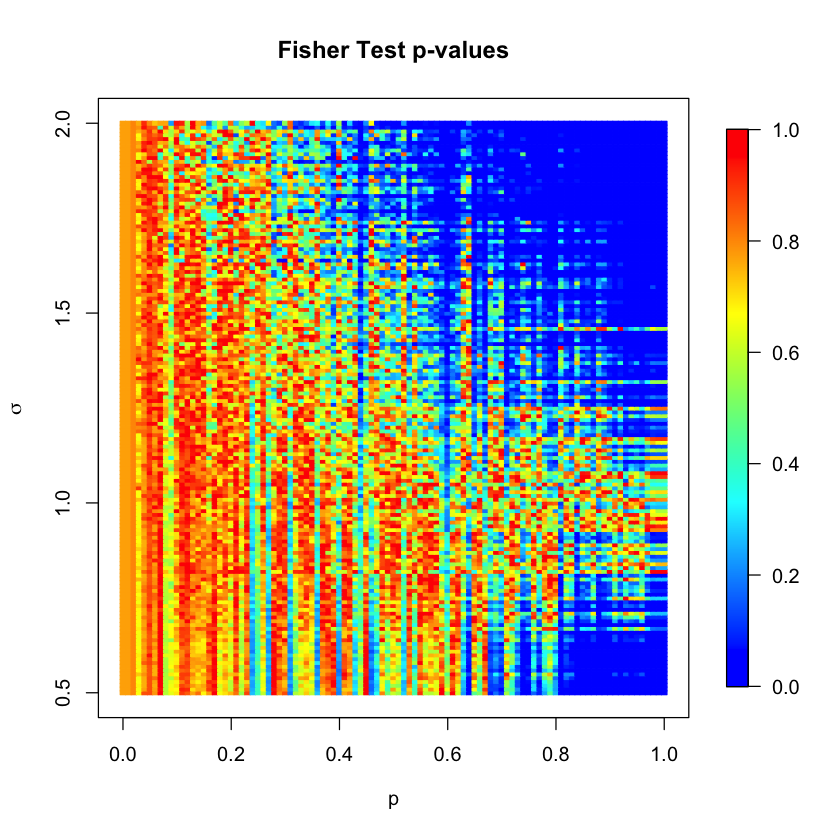

In [28]:
library(fields)

image.plot(p.matr, sigma2.matr, PV_M, 
           col = colorRampPalette(c("blue", "cyan", "yellow", "red"))(1024), 
           main="Fisher Test p-values", xlab=expression(p), ylab=expression(sigma))

In [29]:
t1 <- list(
    rep(2, 5),
    rep(3, 5),
    rep(4, 5),
    rep(5, 5)
)

t2 <- list(
    rep(0, 5),
    rep(1, 5)
)

In [290]:
class(X2)

[1] "list"

In [291]:
cbind(X1, X2)[1,]

$X1
 [1] -0.46818847 -1.01845203 -2.23162716  2.03537152  2.71576298  1.05023934
 [7] -0.88948803 -2.52018058 -1.84975902  2.59808055 -0.73810175 -2.23326508
[13] -2.02820560 -1.42437907  0.55379695  0.14272449  0.78997579 -0.72334843
[19] -2.67559393  2.36942567 -1.70577780  1.25044938 -0.72922128 -1.19934567
[25]  1.14804768  0.35027695  0.25208779 -2.57100343  1.12270355  2.99258944
[31]  1.53754362  0.66796674 -2.63274091 -0.11237184  2.54546966 -0.49743309
[37] -1.57091498 -1.14627415 -2.31032768 -2.93364600  1.86750116 -0.05017247
[43] -1.23256807 -0.55505449  2.01364894 -1.65029253  2.41656234 -2.17736797
[49] -1.30845334 -1.38169251

$X2
 [1] -1.03565401 -1.12573004 -0.34796407  0.38764179  2.59880601 -1.54830409
 [7]  1.26905863  1.84685346 -2.93693809 -1.90424332 -1.78432445  2.32490695
[13]  0.40891813  2.01990619 -2.14742375  2.17137940 -1.07306771 -0.24767245
[19] -2.23005592 -2.23505514 -2.99556872 -2.77718596 -2.40469577  0.85690352
[25]  1.50437152  0.50689650 -2.10975742 -0.26679060  1.96901697 -0.25762026
[31] -0.44392933 -1.73737059  2.86626067  2.51330659  1.82122297  2.39456649
[37] -0.85247299  2.34567080 -0.18575138 -0.64469348 -0.49310619  2.69733149
[43]  0.05173712 -2.11102058 -2.25389108 -0.73080367 -2.71766325  2.80148896
[49]  0.17894368  2.10441835

In [292]:
head(X1)

$`1`
 [1] -0.46818847 -1.01845203 -2.23162716  2.03537152  2.71576298  1.05023934
 [7] -0.88948803 -2.52018058 -1.84975902  2.59808055 -0.73810175 -2.23326508
[13] -2.02820560 -1.42437907  0.55379695  0.14272449  0.78997579 -0.72334843
[19] -2.67559393  2.36942567 -1.70577780  1.25044938 -0.72922128 -1.19934567
[25]  1.14804768  0.35027695  0.25208779 -2.57100343  1.12270355  2.99258944
[31]  1.53754362  0.66796674 -2.63274091 -0.11237184  2.54546966 -0.49743309
[37] -1.57091498 -1.14627415 -2.31032768 -2.93364600  1.86750116 -0.05017247
[43] -1.23256807 -0.55505449  2.01364894 -1.65029253  2.41656234 -2.17736797
[49] -1.30845334 -1.38169251

$`2`
 [1] -1.01845203 -2.23162716  2.03537152  2.71576298  1.05023934 -0.88948803
 [7] -2.52018058 -1.84975902  2.59808055 -0.73810175 -2.23326508 -2.02820560
[13] -1.42437907  0.55379695  0.14272449  0.78997579 -0.72334843 -2.67559393
[19]  2.36942567 -1.70577780  1.25044938 -0.72922128 -1.19934567  1.14804768
[25]  0.35027695  0.25208779 -2.57100343  1.12270355  2.99258944  1.53754362
[31]  0.66796674 -2.63274091 -0.11237184  2.54546966 -0.49743309 -1.57091498
[37] -1.14627415 -2.31032768 -2.93364600  1.86750116 -0.05017247 -1.23256807
[43] -0.55505449  2.01364894 -1.65029253  2.41656234 -2.17736797 -1.30845334
[49] -1.38169251 -0.46818847

$`3`
 [1] -2.23162716  2.03537152  2.71576298  1.05023934 -0.88948803 -2.52018058
 [7] -1.84975902  2.59808055 -0.73810175 -2.23326508 -2.02820560 -1.42437907
[13]  0.55379695  0.14272449  0.78997579 -0.72334843 -2.67559393  2.36942567
[19] -1.70577780  1.25044938 -0.72922128 -1.19934567  1.14804768  0.35027695
[25]  0.25208779 -2.57100343  1.12270355  2.99258944  1.36405780  0.66796674
[31] -2.63274091 -0.11237184  2.54546966 -0.49743309 -1.57091498 -1.14627415
[37] -2.31032768 -2.93364600  1.86750116 -0.05017247 -1.23256807 -0.55505449
[43]  2.01364894 -1.65029253  2.41656234 -2.17736797 -1.30845334 -1.38169251
[49] -0.46818847 -1.01845203

$`4`
 [1]  2.03537152  2.71576298  1.05023934 -0.88948803 -2.52018058 -1.84975902
 [7]  2.59808055 -0.73810175 -2.23326508 -2.02820560 -1.42437907  0.55379695
[13]  0.14272449  0.78997579 -0.72334843 -2.67559393  2.36942567 -1.70577780
[19]  1.25044938 -0.72922128 -1.19934567  1.14804768  0.35027695  0.25208779
[25] -2.57100343  1.12270355  2.99258944  1.53754362  0.73658039 -2.63274091
[31] -0.11237184  2.54546966 -0.49743309 -1.57091498 -1.14627415 -2.31032768
[37] -2.93364600  1.86750116 -0.05017247 -1.23256807 -0.55505449  2.01364894
[43] -1.65029253  2.41656234 -2.17736797 -1.30845334 -1.38169251 -0.46818847
[49] -1.01845203 -2.23162716

$`5`
 [1]  2.71576298  1.05023934 -0.88948803 -2.52018058 -1.84975902  2.59808055
 [7] -0.73810175 -2.23326508 -2.02820560 -1.42437907  0.55379695  0.14272449
[13]  0.78997579 -0.72334843 -2.67559393  2.36942567 -1.70577780  1.25044938
[19] -0.72922128 -1.19934567  1.14804768  0.35027695  0.25208779 -2.57100343
[25]  1.12270355  2.99258944  1.53754362  0.66796674 -0.55542515 -0.11237184
[31]  2.54546966 -0.49743309 -1.57091498 -1.14627415 -2.31032768 -2.93364600
[37]  1.86750116 -0.05017247 -1.38603250 -0.55505449  2.01364894 -1.65029253
[43]  2.41656234 -2.17736797 -1.30845334 -1.38169251 -0.46818847 -1.01845203
[49] -2.23162716  2.03537152

$`6`
 [1]  1.05023934 -0.88948803 -2.52018058 -1.84975902  2.59808055 -0.73810175
 [7] -2.23326508 -2.02820560 -1.42437907  0.55379695  0.14272449  0.78997579
[13] -0.72334843 -2.67559393  2.36942567 -1.70577780  1.25044938 -0.72922128
[19] -1.19934567  1.14804768  0.35027695  0.25208779 -2.57100343  1.12270355
[25]  2.99258944  1.53754362  0.66796674 -2.63274091 -0.63791011  2.54546966
[31] -0.49743309 -1.57091498 -1.14627415 -2.31032768 -2.93364600  1.86750116
[37] -0.05017247 -1.23256807 -0.01948831  2.01364894 -1.65029253  2.41656234
[43] -2.17736797 -1.30845334 -1.38169251 -0.46818847 -1.01845203 -2.23162716
[49]  2.03537152  2.71576298

In [371]:
l1 <- list(
    c(1,1),
    c(1,2),
    c(1,3),
    c(2,1),
    c(2,2),
    c(2,3)
)

l2 <- list(
    c(0,1),
    c(0,2),
    c(0,3)
)

l22 <- cbind(l1,l2)

In [398]:
array(1:20, c(2,5,2))[,1,]

1,11
2,12


In [372]:
l22

l1,l2
"1, 1","0, 1"
"1, 2","0, 2"
"1, 3","0, 3"
"2, 1","0, 1"
"2, 2","0, 2"
"2, 3","0, 3"


In [380]:
a <- array(unlist(l22), c(2,2,3))

In [381]:
a[1,,]

1,1,2
1,2,2


In [382]:
a[,1,]

1,1,2
1,3,2


In [383]:
a[,,1]

1,1
1,2


In [384]:
a[1,1,]

[1] 1 1 2

In [385]:
a[,1,1]

[1] 1 1

In [386]:
a[1,,1]

[1] 1 1

In [261]:
dim(X1.X2) = c(2, length(p1), length(sigma2))

In [263]:
X1.X2[,1,1]

[[1]]
 [1] -1.77820537 -0.32861247  1.84416915 -0.42264608  1.23045124  1.25971747
 [7] -0.30265992  1.44292142  0.16609414 -2.81450143 -0.59671588  0.49928165
[13] -0.85261467  0.40696594 -1.93988134 -1.61990229 -2.00361105  0.84805282
[19]  0.58698229 -1.26239750  0.38377652  0.07264718 -1.81369328 -2.06487089
[25]  1.35893553 -1.06787014 -1.11074934  1.18601998 -2.89758237  2.56253598
[31] -1.07424587 -0.55718300 -0.20229926 -0.30616573 -0.40852547  1.50997037
[37]  2.87138818  0.07714588  0.62688585 -1.54984982  0.61480176  2.19414490
[43]  1.97668863  2.65013215  2.66559214  1.52674139  0.12227655  1.29990230
[49]  0.69758055  1.12713330

[[2]]
 [1] -0.32861247  1.84416915 -0.42264608  1.23045124  1.25971747 -0.30265992
 [7]  1.44292142  0.16609414 -2.81450143 -0.59671588  0.49928165 -0.85261467
[13]  0.40696594 -1.93988134 -1.61990229 -2.00361105  0.84805282  0.58698229
[19] -1.26239750  0.38377652  0.07264718 -1.81369328 -2.06487089  1.35893553
[25] -1.06787014 -1.11074934  1.18601998 -2.89758237  2.56253598 -1.07424587
[31] -0.55718300 -0.20229926 -0.30616573 -0.40852547  1.50997037  2.87138818
[37]  0.07714588  0.62688585 -1.54984982  0.61480176  2.19414490  1.97668863
[43]  2.65013215  2.66559214  1.52674139  0.12227655  1.29990230  0.69758055
[49]  1.12713330 -1.77820537

In [32]:
dim(X1.X2)

[1] 15251     2

In [33]:
d <- data.frame(x=runif(1e5),y=runif(1e5))

In [34]:
a <- 1:1000
dim(a) <- c(10,10,10)

In [399]:
A <- array(0, c(length(sigma2), length(p1), 2, n1))
dim(A)

[1] 151 101   2  50

In [413]:
X1.X2[2,][2]

$X2
 [1] -1.12573004 -0.34796407  0.38764179  2.59880601 -1.54830409  1.26905863
 [7]  1.84685346 -2.93693809 -1.90424332 -1.78432445  2.32490695  0.40891813
[13]  2.01990619 -2.14742375  2.17137940 -1.07306771 -0.24767245 -2.23005592
[19] -2.23505514 -2.99556872 -2.77718596 -2.40469577  0.85690352  1.50437152
[25]  0.50689650 -2.10975742 -0.26679060  1.96901697 -0.25762026 -0.44392933
[31] -1.73737059  2.86626067  2.51330659  1.82122297  2.39456649 -0.85247299
[37]  2.34567080 -0.18575138 -0.64469348 -0.49310619 -0.12066670  0.05173712
[43] -2.11102058 -2.25389108 -0.73080367 -2.71766325  2.80148896  0.17894368
[49]  2.10441835 -1.03565401

In [405]:
A <- array(0, c(length(sigma2), length(p1), 2, n1))
dim(A)

[1] 151 101   2  50

In [422]:
A[1,1,,][1]

-0.468188472557813,-1.01845202967525,-2.23162715882063,2.03537151636556,2.71576298307627,1.05023934273049,-0.88948802696541,-2.52018057508394,-1.84975901758298,2.59808055125177,⋯,1.86750115687028,-0.0501724658533931,-1.23256806889549,-0.555054493714124,2.01364894397557,-1.65029252506793,2.41656234255061,-2.17736796615645,-1.30845334008336,-1.38169250590727
-1.03565400838852,-1.12573004420847,-0.34796407353133,0.387641794513911,2.59880601475015,-1.54830408934504,1.26905862847343,1.84685345739126,-2.93693808792159,-1.90424332441762,⋯,-0.493106185924262,2.69733149232343,0.0517371213063598,-2.11102057574317,-2.25389107502997,-0.73080367455259,-2.71766325412318,2.80148895643651,0.178943680599332,2.10441834619269


In [409]:
for(i in 1:length(sigma2)) {
    for(j in 1:length(p1)) {
        for(k in 1:2) {
            A[i, j, k, ] <- unlist(X1.X2[(i-1)*length(p1) + j,][k])
       }
    }
}

In [415]:
parApply(cl = cl, X = A, MARGIN = c(1,2), function(x) var.test(x[]))

with {base},R Documentation
data,"data to use for constructing an environment. For the default with method this may be an environment, a list, a data frame, or an integer as in sys.call. For within, it can be a list or a data frame."
expr,expression to evaluate.
...,arguments to be passed to future methods.


In [ ]:
parApply(cl = cl, X = A, MARGIN = c(1,2), function(x))

In [414]:
A[1,2,,]

-1.01845202967525,-2.23162715882063,2.03537151636556,2.71576298307627,1.05023934273049,-0.88948802696541,-2.52018057508394,-1.84975901758298,2.59808055125177,-0.738101752940565,⋯,-0.0501724658533931,-1.23256806889549,-0.555054493714124,2.01364894397557,-1.65029252506793,2.41656234255061,-2.17736796615645,-1.30845334008336,-1.38169250590727,-0.468188472557813
-1.12573004420847,-0.34796407353133,0.387641794513911,2.59880601475015,-1.54830408934504,1.26905862847343,1.84685345739126,-2.93693808792159,-1.90424332441762,-1.78432444855571,⋯,-0.120666704940541,0.0517371213063598,-2.11102057574317,-2.25389107502997,-0.73080367455259,-2.71766325412318,2.80148895643651,0.178943680599332,2.10441834619269,-1.03565400838852


In [59]:
dim(matrix(X2, nrow=length(sigma2), ncol=length(p1)))

[1] 151 101

In [64]:
X2.matr.t <- matrix(X2, nrow=length(sigma2), ncol=length(p1))
dim(X2.matr.t)

[1] 151 101

In [129]:
t4 <- array(0, c(2,2,5))

In [127]:
t4[1,1,]

[1] 0 0 0 0

In [124]:
cbind(t1,t2)

t1,t2
"2, 2, 2, 2, 2","0, 0, 0, 0, 0"
"3, 3, 3, 3, 3","1, 1, 1, 1, 1"
"4, 4, 4, 4, 4","0, 0, 0, 0, 0"
"5, 5, 5, 5, 5","1, 1, 1, 1, 1"


In [121]:
t3 <- (apply(cbind(t1,t2), c(1,2), unlist))

In [255]:
head(X1.X2)

,X1,X2
1.1,"-1.77820537, -0.32861247, 1.84416915, -0.42264608, 1.23045124, 1.25971747, -0.30265992, 1.44292142, 0.16609414, -2.81450143, -0.59671588, 0.49928165, -0.85261467, 0.40696594, -1.93988134, -1.61990229, -2.00361105, 0.84805282, 0.58698229, -1.26239750, 0.38377652, 0.07264718, -1.81369328, -2.06487089, 1.35893553, -1.06787014, -1.11074934, 1.18601998, -2.89758237, 2.56253598, -1.07424587, -0.55718300, -0.20229926, -0.30616573, -0.40852547, 1.50997037, 2.87138818, 0.07714588, 0.62688585, -1.54984982, 0.61480176, 2.19414490, 1.97668863, 2.65013215, 2.66559214, 1.52674139, 0.12227655, 1.29990230, 0.69758055, 1.12713330","2.79038146, -1.18781905, 1.52326382, 1.73568488, -1.55574203, 2.94128192, 2.33566967, -2.83010025, 1.48274460, -0.24362837, -0.09032759, -1.84653001, -2.62108066, 0.01492957, 0.72621277, 0.85102073, -2.10575844, -2.47205028, -0.56535206, -2.13711084, -2.40101232, -0.37725619, 2.23953305, -0.87232628, 0.47085284, 1.56684492, -2.12058183, -1.09194164, -1.55572383, 1.87473537, 0.83987845, 0.77070945, -0.26213108, 0.89070715, 2.03937020, -0.17326794, 0.30195565, 2.95681959, -1.34215227, -1.39650166, 0.04739591, -1.54667017, -2.68808679, 2.92190771, 2.30436643, 2.27074153, -1.19124735, -0.31425373, -1.03791653, 2.54424657"
1.2,"-0.32861247, 1.84416915, -0.42264608, 1.23045124, 1.25971747, -0.30265992, 1.44292142, 0.16609414, -2.81450143, -0.59671588, 0.49928165, -0.85261467, 0.40696594, -1.93988134, -1.61990229, -2.00361105, 0.84805282, 0.58698229, -1.26239750, 0.38377652, 0.07264718, -1.81369328, -2.06487089, 1.35893553, -1.06787014, -1.11074934, 1.18601998, -2.89758237, 2.56253598, -1.07424587, -0.55718300, -0.20229926, -0.30616573, -0.40852547, 1.50997037, 2.87138818, 0.07714588, 0.62688585, -1.54984982, 0.61480176, 2.19414490, 1.97668863, 2.65013215, 2.66559214, 1.52674139, 0.12227655, 1.29990230, 0.69758055, 1.12713330, -1.77820537","-1.18781905, 1.52326382, 1.73568488, -1.55574203, 2.94128192, 2.33566967, -2.83010025, 1.48274460, -0.24362837, -0.09032759, -1.84653001, -2.62108066, 0.01492957, 0.72621277, 0.85102073, -2.10575844, -2.47205028, -0.56535206, -2.13711084, -2.40101232, -0.37725619, 2.23953305, -0.87232628, 0.47085284, 1.56684492, -2.12058183, -1.09194164, -1.55572383, 1.87473537, 0.83987845, 0.77070945, -0.26213108, 0.89070715, 2.03937020, -0.17326794, 0.30195565, 2.95681959, -1.34215227, -1.39650166, 0.04739591, -1.54667017, -2.68808679, 2.92190771, 2.30436643, 2.27074153, -1.19124735, -0.31425373, -1.03791653, 2.54424657, 2.79038146"
1.3,"1.84416915, -0.42264608, 1.23045124, 1.25971747, -0.30265992, 1.44292142, 0.16609414, -2.81450143, -0.59671588, 0.49928165, -0.85261467, 0.40696594, -1.93988134, -1.61990229, -2.00361105, 0.84805282, 0.58698229, -1.26239750, 0.38377652, 0.07264718, -1.81369328, -2.06487089, 1.35893553, -1.06787014, -1.11074934, 1.18601998, -2.89758237, 2.56253598, -1.07424587, -0.55718300, -0.20229926, -0.30616573, -0.40852547, 1.50997037, 2.87138818, 0.07714588, 0.62688585, -1.54984982, 0.61480176, 2.19414490, 1.97668863, 2.65013215, 2.66559214, 1.52674139, 0.12227655, 1.29990230, 0.69758055, 1.12713330, -1.77820537, -0.32861247","1.523263824, 1.735684885, -1.555742030, 2.941281918, 2.335669672, -2.830100249, 1.482744595, -0.243628370, -0.090327587, -1.846530010, -2.621080664, -0.009206688, 0.726212772, 0.851020730, -2.105758441, -2.472050279, -0.565352057, -2.137110845, -2.401012324, -0.377256186, 2.239533054, -0.872326281, 0.470852841, 1.566844916, -2.120581832, -1.091941643, -1.555723830, 1.874735368, 0.839878452, 0.770709448, -0.262131076, 0.890707150, 2.039370197, -0.173267936, 0.301955655, 2.956819592, -1.342152275, -1.396501661, 0.047395912, -1.546670166, -2.688086785, 2.921907712, 2.304366429, 2.270741531, -1.191247350, -0.314253731, -1.037916531, 2.544246571, 2.790381457, -1.187819045"
1.4,"-0.42264608, 1.23045124, 1.25971747, -0.30265992, 1.44292142, 0.16609414, -2.81450143, -0.59671588, 0.49928165, -0.85261467, 0.40696594, -1.93988134, -1.61990229, -2.00361105,

In [168]:
t3[4,1,]

t1 t2 
 2  0

In [254]:
head(split(dim(X1.X2), 1:15251)

$`1`
[1] 15251

$`2`
[1] 2

$`3`
integer(0)

$`4`
integer(0)

$`5`
integer(0)

$`6`
integer(0)

In [253]:
matrix(split(dim(X1.X2), 1:15251), nrow = length(sigma2), ncol = length(p1))[1,1]

Warning message:
In split.default(dim(X1.X2), 1:15251): длина данных не является произведением разделенной переменной

[[1]]
[1] 15251

In [155]:
t5<-t3
dim(t5) = c(4,2,5)

In [213]:
f<-1:12
dim(f) = c(2,3,2)

In [319]:
f[,2,1]

[1] 3 4

In [246]:
t(apply(f, c(3,2), function(x) mean(x)))

1.5,7.5
3.5,9.5
5.5,11.5


In [152]:
dim(t5) = c(1,2)

ERROR: Error in dim(t5) = c(1, 2): измерения [произведение 2] не соответствуют длине объекта [40]


In [201]:
t3[,1,1]

[1] 2 2 2 2 2

In [131]:
t4[1:2,1:2,]

, , 1

     [,1] [,2]
[1,]    2    0
[2,]    0    0

, , 2

     [,1] [,2]
[1,]    2    0
[2,]    0    0

, , 3

     [,1] [,2]
[1,]    2    0
[2,]    0    0

, , 4

     [,1] [,2]
[1,]    2    0
[2,]    0    0

, , 5

     [,1] [,2]
[1,]    2    0
[2,]    0    0

In [199]:
t4[1,2,] <- t3[,1,2]

In [200]:
t4[1,1,]

[1] 2 2 2 2 2

In [146]:
t3[,1,1]

[1] 2 2 2 2 2

In [103]:
X2.matr.t[1,1]

[[1]]
 [1]  1.54941411 -1.32328466  1.57824979 -0.70784414 -0.83688255  2.57766485
 [7]  2.46634462  1.37743979  2.64369987 -0.88714974 -1.02416828 -1.07608201
[13]  1.06969064  2.73048733 -0.79069181  2.46584903  1.04788967  2.51640623
[19] -0.48641285 -1.93645121 -2.77692947 -1.93669714 -1.21058835 -1.80502496
[25]  2.73692861  0.40058666 -0.10277535  0.30425311 -0.51860048  0.78455262
[31]  2.10860895 -2.56501215  1.73041983  1.57185815 -1.16625882  2.08867570
[37]  2.78793292  2.32333537 -1.04290357 -0.79985349  0.79891713  2.14571038
[43]  2.04823774 -0.58480105  1.42332531  2.81703674  2.36885987 -0.76130912
[49] -1.79926769 -0.08892957

In [113]:
tdf<-apply(X2.matr.t, c(1,2), function(x) mean(unlist(x)))
#dim(tdf) = c(length(sigma2), length(p1), 50)

In [114]:
dim(tdf)

[1] 151 101

In [94]:
ook<- c(1:12)
dim(ook) = c(2,2,3)

In [98]:
ook

, , 1

     [,1] [,2]
[1,]    1    3
[2,]    2    4

, , 2

     [,1] [,2]
[1,]    5    7
[2,]    6    8

, , 3

     [,1] [,2]
[1,]    9   11
[2,]   10   12

In [96]:
ook[,,3]

9,11
10,12


In [51]:
A[,,1,] = matrix(X2, nrow=length(sigma2), ncol=length(p1))
# A[,,2,] = 2

ERROR: Error in A[, , 1, ] = matrix(X2, nrow = length(sigma2), ncol = length(p1)): неправильное количество подгрупп


In [62]:
length(A[,,1,])

[1] 762550

In [47]:
d <- apply(A, c(1,2), function(x) mean(x[1,])*mean(x[2,]))

In [48]:
head(d)

6,6,6,6,6,6,6,6,6,6,⋯,6,6,6,6,6,6,6,6,6,6
6,6,6,6,6,6,6,6,6,6,⋯,6,6,6,6,6,6,6,6,6,6
6,6,6,6,6,6,6,6,6,6,⋯,6,6,6,6,6,6,6,6,6,6
6,6,6,6,6,6,6,6,6,6,⋯,6,6,6,6,6,6,6,6,6,6
6,6,6,6,6,6,6,6,6,6,⋯,6,6,6,6,6,6,6,6,6,6
6,6,6,6,6,6,6,6,6,6,⋯,6,6,6,6,6,6,6,6,6,6


In [39]:
head(d <- data.frame(x=runif(1e5),y=runif(1e5)))

,x,y
1,0.1220361,0.269437
2,0.2512745,0.4738553
3,0.8932652,0.3379512
4,0.2336122,0.1256363
5,0.7663688,0.05822989
6,0.9434636,0.6714569


In [33]:
print(c(dim(X2.Norm.ind.matr), dim(X2.norm.list[[1]])))

[1] 101  50


In [34]:
length(X2.norm.list[[1]])

[1] 50

In [35]:
y.X2 <- unlist(
            lapply(X2.norm.list, function(X2.sigma.norm) split(X2.Norm.ind.matr*X2.sigma.norm + X2.F2, 1:length(p2))),
            recursive=FALSE
        )

In [36]:
X1.list[[1]]

ERROR: Error in eval(expr, envir, enclos): объект 'X1.list' не найден


In [ ]:
var.test(y.X2[[1]], X1.list[[1]])

In [ ]:
15251/101

In [ ]:
X2.norm.matr

In [ ]:
logical()

In [ ]:
t.X2.sigma <- split(matrix(rnorm(n2*length(sigma2), mean = 0, sd = sigma2), nrow=length(sigma2)), 1:length(sigma2))

In [ ]:
dim(X2.F2)

In [ ]:
dim(lapply(t.X2.sigma, function(X2.sigma.norm) X2.Norm.ind.matr*X2.sigma.norm + X2.F2)[[1]])

In [181]:
sigma1 = 1
sigma2 = seq(from = 0.5, to = 2, by = 0.01)
p=p1=p2 = seq(from = 0, to = 1, by = 0.01)
n=n1=n2 = 50





In [182]:
#F <- runif(n1, min = -3, max = 3)
#weight <- runif(n2)

# Матрица индексов для F1 распределения. Знак => в lapply, т.к. мы берем из F1, если вес < p
Norm.ind.matr <- matrix(unlist(lapply(p1, function(p) weight <= p)), nrow = length(weight))
dim(Norm.ind.matr)

[1]  50 101

In [183]:
# Выборки по столбцам
F.p <- F*!Norm.ind.matr
dim(F.p)

[1]  50 101

### Генерируем X1

In [184]:
X1.Norm <- rnorm(n1, mean = 0, sd = 1)

# Выборки по строкам
X1 <- t(X1.Norm*Norm.ind.matr + F.p)
dim(X1)

[1] 101  50

### Генерируем X2

In [185]:
# Генерируем матрицу, в строках которой будут выбороки из
# нормального распределения с sigma2[ind], где ind номер строки матрицы
X2.norm.matr <- matrix(rnorm(n2*length(sigma2), mean = 0, sd = sigma2), nrow=length(sigma2))
print(dim(X2.norm.matr))

# Разделяем матрицу выборок на список выборок
X2.norm.list <- split(X2.norm.matr, 1:length(sigma2))
print(all(X2.norm.list[[1]] == X2.norm.matr[1,]))
print(length(X2.norm.list[[1]]))

# Для каждой конкретной выборки X2.norm создаем  X2
X2n <- lapply(X2.norm.list, function(X2.norm) t(Norm.ind.matr*X2.norm + F.p))
print(length(X2n))
# В строках - выборки
print(dim(X2n[[1]]))

[1] 151  50
[1] TRUE
[1] 50
[1] 151
[1] 101  50


## Считаем p-value

In [187]:
# список выборок из X1
X1.list <- split(X1, 1:length(p))
X2.1.list <- split(X2n[[61]], 1:length(p)) # выборки для 1-й дисперсии

In [186]:
library(parallel)
no_cores <- detectCores() - 1
cl <- makeCluster(no_cores)

In [191]:
parLapply(cl, 2:4, function(exponent) 2^exponent)

[[1]]
[1] 4

[[2]]
[1] 8

[[3]]
[1] 16

In [188]:
# Список по сигма, списокв по p
X2n.list <- lapply(X2n, function(X2) split(X2,  1:length(p)))

In [189]:
# Список по сигма, списков пар X1,X2 по p 
X2n.X1 <- lapply(X2n.list, function(X2.list) split(t(rbind(X1.list, X2.list)), 1:length(p)))

In [192]:
p.value.matr <- parLapply(cl, X2n.X1, function(X.sigm) 
    lapply(X.sigm, function(X) var.test(unlist(X[1]), unlist(X[2]))$p.value)
)

In [ ]:
N       <- length(p)
M       <- length(sigma2)
grid    <- expand.grid(x=p, y=sigma2)

In [ ]:
PV_F <- matrix(unlist(p.value.matr), nrow=N, ncol=M)
Pow_ST <- PV_F <= 0.05

In [ ]:
library(fields)

In [ ]:
library(fields)
sigma2.matr <- matrix(grid$x, nrow=N, ncol=M)
p.matr <- matrix(grid$y, nrow=N, ncol=M)

In [ ]:
dim(PV_F)

In [ ]:
library(fields)

N       <- length(p)
M       <- length(sigma2)
grid    <- expand.grid(x=p, y=sigma2)
sigma2.matr <- matrix(grid$x, nrow=N, ncol=M)
p.matr <- matrix(grid$y, nrow=N, ncol=M)

print(dim(PV_F))
print(dim(sigma2.matr))
print(dim(p.matr))
image.plot(sigma2.matr, p.matr, PV_F, 
           col = colorRampPalette(c("blue", "cyan", "yellow", "red"))(1024), 
           main="Fisher Test p-values", xlab=expression(p), ylab=expression(sigma))

In [ ]:
image.plot(sigma2.matr, p.matr, PV_F, 
           col = colorRampPalette(c("blue", "cyan", "yellow", "red"))(1024), 
           main="Fisher Test p-values", xlab=expression(p), ylab=expression(sigma))

In [ ]:
X1.Norm.ind.matr

In [ ]:
X2.Norm.ind.matr

In [ ]:
dim(PV_F)

In [ ]:
max(PV_F[1,])

In [ ]:
which.max(PV_F[1,])

In [ ]:
length(PV_F[1,])

In [ ]:
sigma2[73]

In [ ]:
var.test(rnorm(n1, mean = 0, sd = 1), rnorm(n1, mean = 0, sd = 1))

In [ ]:
dim(X1)

In [ ]:
p.matr

In [ ]:
length(X1.list)

In [ ]:
rbind(X1.list, split(X2n[[1]], 1:n2))

In [ ]:
length(X2n)

In [ ]:
all(splitList[[1]] == X2n[1,])

In [ ]:
mean(splitList[[2]])

In [ ]:
X2n <- lapply(splitList, function(X2) X2*Norm.matr + F.p)

In [ ]:
X2n[[1]]

In [ ]:
TMP1 <- lapply(X2n, function(X2) lapply(split(X2, 1:nrow(X2)), function(X2_row) mean(X2_row)))

In [ ]:
TMP1[[1]]

In [ ]:
ncol(X1)

In [ ]:
length(p1)

In [ ]:
nrow(X2n[[1]])

In [ ]:
split(X1, 1:nrow(X1))

In [ ]:
rnorm(n2, mean = rep(0, length(sigma2)), sd = sigma2)

In [ ]:
sigma2

# X1

In [ ]:
X1.Norm1 = rnorm(n1, mean = 0, sd = sigma1)
X1.F1 = runif(n1, min = -3, max = 3)
X1.weights = runif(n2) < 0.5

In [ ]:
X1 = rep.int(0, 50)
X1[X1.weights] = X1.Norm1[X1.weights]
X1[!X1.weights] = X1.F1[!X1.weights]

In [ ]:
X1

# X2

In [ ]:
X2.Norm2 = rnorm(n2, mean = 0, sd = 1.5)
X2.F2 = runif(n2, min = -3, max = 3)
X2.weights = runif(n2) < 0.3

In [ ]:
X2 = rep.int(0, 50)
X2[X2.weights] = X2.Norm2[X2.weights]
X2[!X2.weights] = X2.F2[!X2.weights]

In [ ]:
X2

In [ ]:
hist(X1, breaks = 30)

In [ ]:
hist(X2, breaks = 30)

In [ ]:
p.value <- function(n1, n2, sigma1, sigma2){

}

In [ ]:
var.test(X1, X2)

![](http://take.ms/dic66)

In [ ]:
qf(0.05, 49, 49, T, lower.tail = F)

In [ ]:
pf(1.1844, 49, 49, T, lower.tail = F)

In [ ]:
hist(rf(1000, 49, 49), 100)

In [ ]:
runif(n2) < 0.2
runif(n2) < 0.2

In [ ]:
runif(n1) < p1[0]
runif(n2) < p2[0]

In [ ]:
runif(n2) < 

In [ ]:
sigma1 = 1
sigma2 = 1

In [ ]:
x1_seq = 
x2_seq = 